In [1]:
#install kaggale 
!pip install -q kaggle

from google.colab import files
files.upload() 

#create a kaggle folder
! mkdir ~/.kaggle

# copy the kaggle.json  to folder created
! cp kaggle.json ~/.kaggle/

#permission for the json to act 
! chmod 600 ~/.kaggle/kaggle.json

# to list all datasets  in kaggle
! kaggle datasets list  

Saving kaggle.json to kaggle.json
ref                                                             title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
meirnizri/covid19-dataset                                       COVID-19 Dataset                                      5MB  2022-11-13 15:47:17          10057        301  1.0              
mattop/alcohol-consumption-per-capita-2016                      Alcohol Consumption Per Capita 2016                   4KB  2022-12-09 00:03:11           1075         42  1.0              
michals22/coffee-dataset                                        Coffee dataset                                       24KB  2022-12-15 20:02:12           1359         45  1.0              
thedevastator/jobs-dataset

In [2]:
!kaggle datasets download -d puneet6060/intel-image-classification 

100% 345M/346M [00:19<00:00, 19.2MB/s]
100% 346M/346M [00:19<00:00, 19.0MB/s]


In [3]:
!unzip  intel-image-classification.zip 

Streaming output truncated to the last 5000 lines.
  inflating: seg_train/seg_train/mountain/7506.jpg  
  inflating: seg_train/seg_train/mountain/7537.jpg  
  inflating: seg_train/seg_train/mountain/7539.jpg  
  inflating: seg_train/seg_train/mountain/7551.jpg  
  inflating: seg_train/seg_train/mountain/7560.jpg  
  inflating: seg_train/seg_train/mountain/7565.jpg  
  inflating: seg_train/seg_train/mountain/7578.jpg  
  inflating: seg_train/seg_train/mountain/7581.jpg  
  inflating: seg_train/seg_train/mountain/7586.jpg  
  inflating: seg_train/seg_train/mountain/7647.jpg  
  inflating: seg_train/seg_train/mountain/7652.jpg  
  inflating: seg_train/seg_train/mountain/7654.jpg  
  inflating: seg_train/seg_train/mountain/7662.jpg  
  inflating: seg_train/seg_train/mountain/767.jpg  
  inflating: seg_train/seg_train/mountain/7672.jpg  
  inflating: seg_train/seg_train/mountain/7679.jpg  
  inflating: seg_train/seg_train/mountain/7681.jpg  
  inflating: seg_train/seg_train/mountain/7693.jp

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras 

In [5]:
trainpath = 'seg_train/'
testpath = 'seg_test/'
predpath = 'seg_pred/' 

In [6]:
#train data
for folder in  os.listdir(trainpath + 'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 2512 in folder mountain
For training data , found 2271 in folder forest
For training data , found 2382 in folder street
For training data , found 2191 in folder buildings
For training data , found 2404 in folder glacier
For training data , found 2274 in folder sea


In [7]:
#test data labeled
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 525 in folder mountain
For testing data , found 474 in folder forest
For testing data , found 501 in folder street
For testing data , found 437 in folder buildings
For testing data , found 553 in folder glacier
For testing data , found 510 in folder sea


In [8]:
#prediction data unlabel
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}') 

For Prediction data , found 7301


In [9]:
#coding
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x    


In [10]:
#dim train data
size = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts() 

(150, 150, 3)    13986
(113, 150, 3)        7
(111, 150, 3)        3
(135, 150, 3)        3
(108, 150, 3)        2
(144, 150, 3)        2
(134, 150, 3)        2
(123, 150, 3)        2
(146, 150, 3)        2
(136, 150, 3)        2
(142, 150, 3)        2
(143, 150, 3)        2
(76, 150, 3)         1
(119, 150, 3)        1
(105, 150, 3)        1
(149, 150, 3)        1
(110, 150, 3)        1
(97, 150, 3)         1
(120, 150, 3)        1
(102, 150, 3)        1
(100, 150, 3)        1
(124, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(141, 150, 3)        1
(81, 150, 3)         1
(103, 150, 3)        1
(145, 150, 3)        1
(131, 150, 3)        1
(147, 150, 3)        1
(140, 150, 3)        1
dtype: int64

In [11]:
#dim train pred
size = []
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(131, 150, 3)       1
(124, 150, 3)       1
(139, 150, 3)       1
(149, 150, 3)       1
(133, 150, 3)       1
(100, 150, 3)       1
(126, 150, 3)       1
(129, 150, 3)       1
(374, 500, 3)       1
(112, 150, 3)       1
(144, 150, 3)       1
(143, 150, 3)       1
(108, 150, 3)       1
dtype: int64

In [12]:
s = 150

In [13]:
#resize image 150*150
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

In [14]:
print(f'we have {len(X_train)} items in X_train') 
print(f'we have {len(y_train)} items in y_train') 

we have 14034 items in X_train
we have 14034 items in y_train


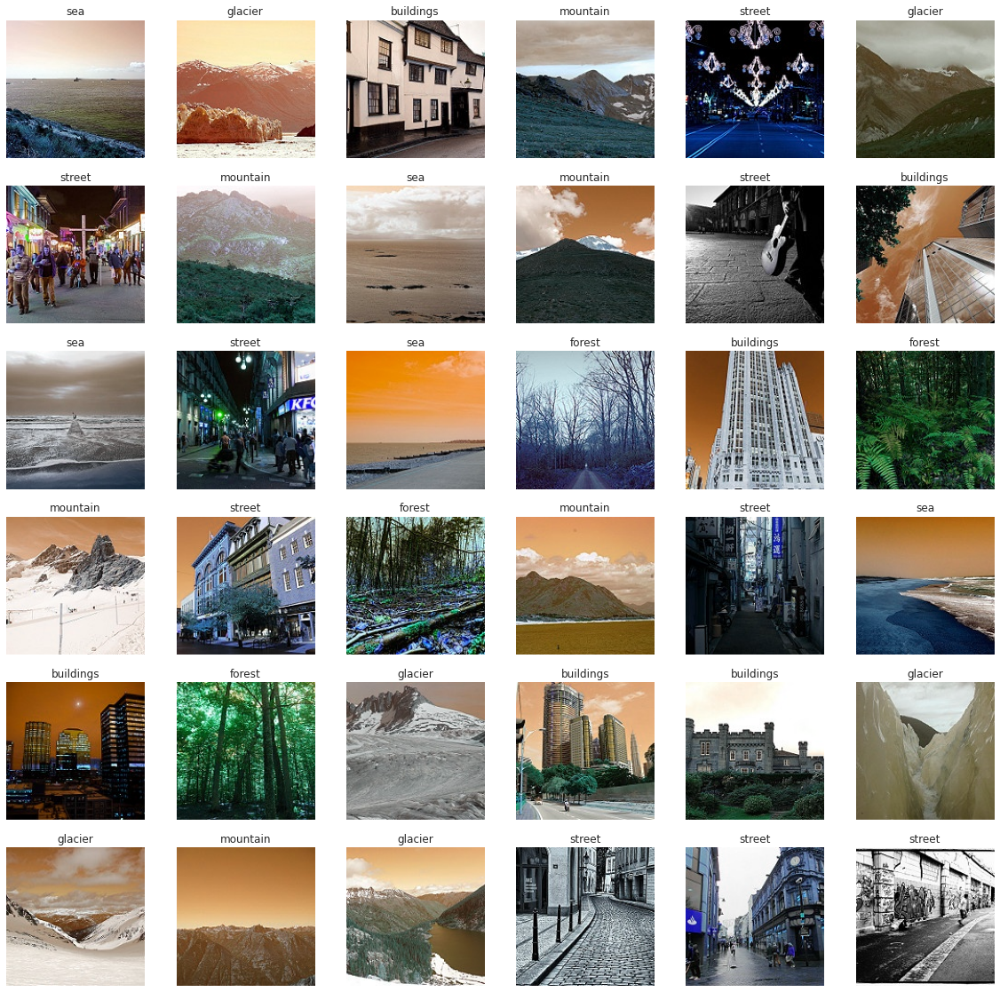

In [15]:
#example of train
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i])) 


In [16]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])

In [17]:
print(f'we have {len(X_test)} items in X_test')
print(f'we have {len(y_test)} items in y_test')

we have 3000 items in X_test
we have 3000 items in y_test


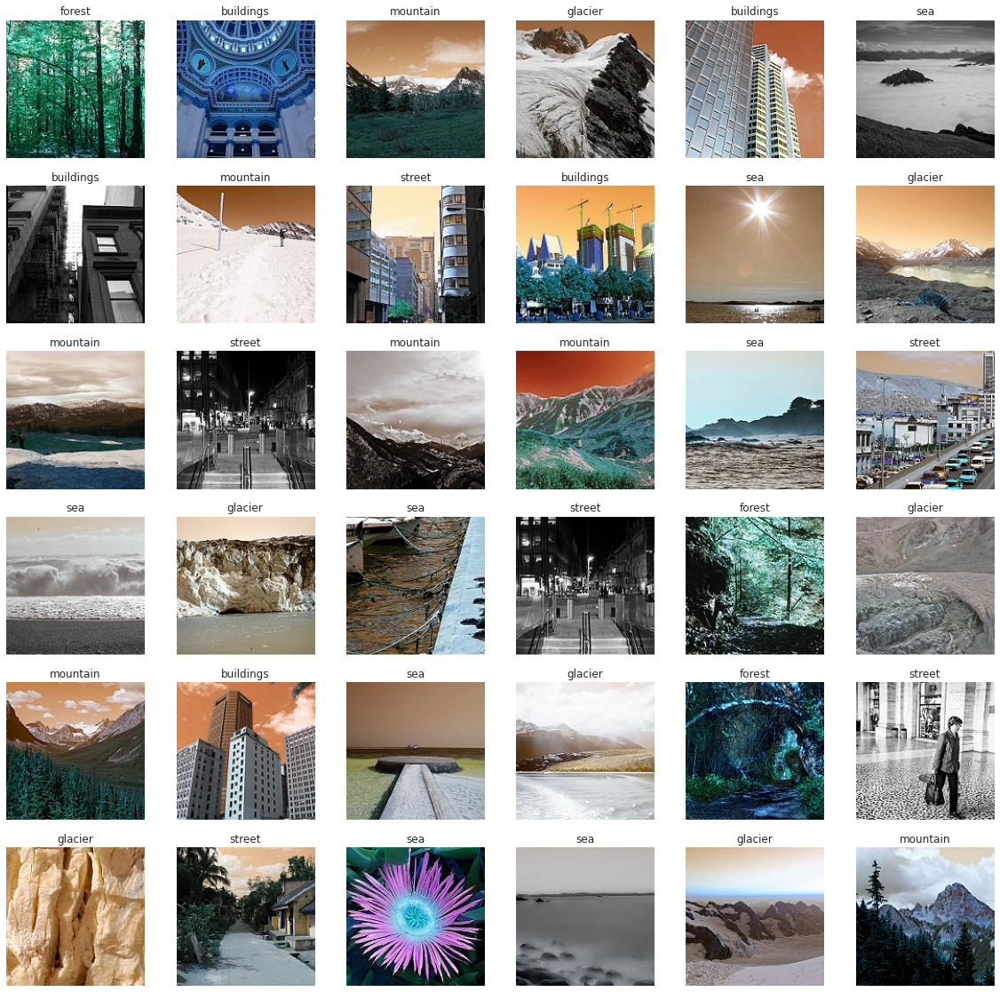

In [18]:
#example of test
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [19]:
X_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))

In [20]:
print(f'we have {len(X_pred)} items in X_pred') 

we have 7301 items in X_pred


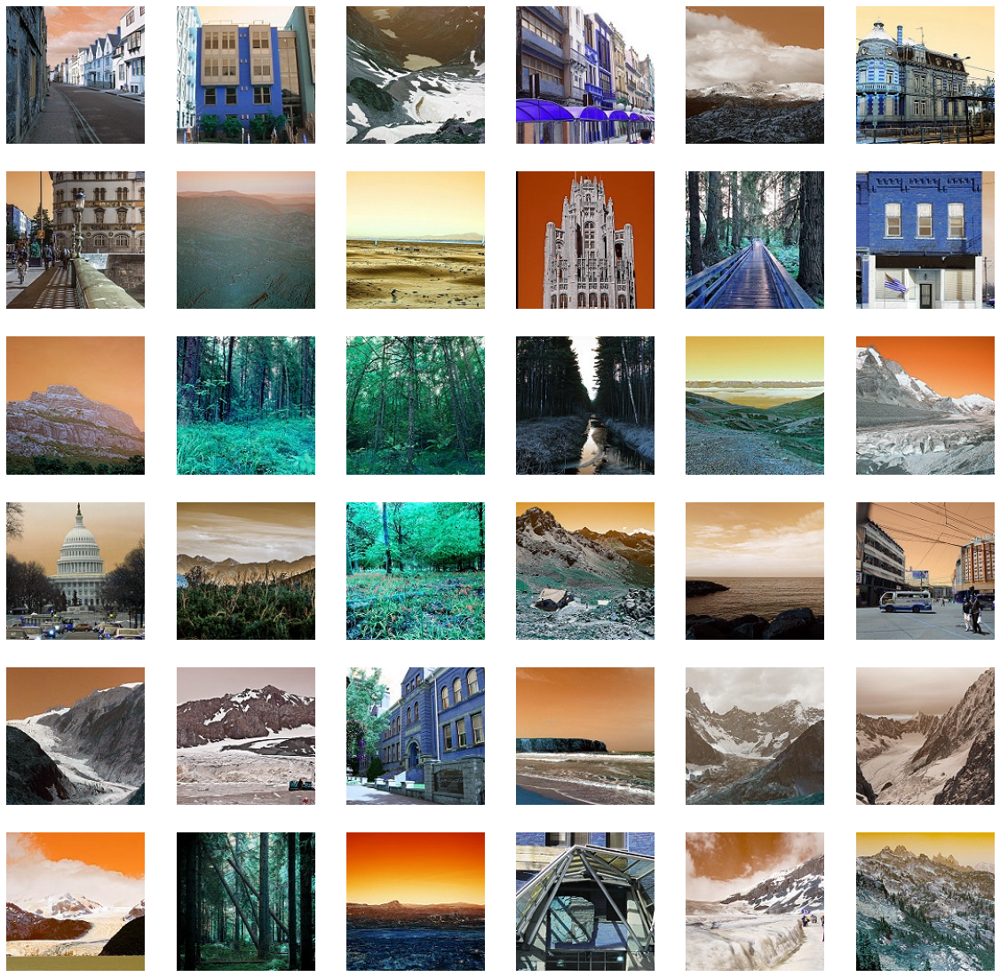

In [21]:
#example of pred
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off') 

In [22]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 150, 150, 3)
X_test shape  is (3000, 150, 150, 3)
X_pred shape  is (7301, 150, 150, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


In [23]:
KerasModel = keras.models.Sequential([

keras.layers.Conv2D(32, (3, 3), activation='relu',  input_shape=(s, s, 3)) ,
keras.layers.MaxPool2D(2,2),
keras.layers.BatchNormalization(),
#keras.layers.Dropout(0.2) ,

keras.layers.Conv2D(32, (3, 3), activation='relu') ,
keras.layers.MaxPool2D(2,2),
keras.layers.BatchNormalization(),
#keras.layers.Dropout(0.2) ,

keras.layers.Flatten() ,    
keras.layers.Dense(32,activation='relu') ,   
keras.layers.Dense(6,activation='softmax') ,    

     ]) 
######################################################################
#increase Layers

# KerasModel = keras.models.Sequential([
#         keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
#         keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
#         keras.layers.MaxPool2D(4,4),
#         keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
#         keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
#         keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
#         keras.layers.MaxPool2D(4,4),
#         keras.layers.Flatten() ,    
#         keras.layers.Dense(120,activation='relu') ,    
#         keras.layers.Dense(100,activation='relu') ,    
#         keras.layers.Dense(50,activation='relu') ,        
#         #keras.layers.Dropout(rate=0.5) ,            
#         keras.layers.Dense(6,activation='softmax') ,    
#         ])

In [24]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [25]:
print('Model Details are : ')
print(KerasModel.summary())


Model Details are : 
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 74, 74, 32)       128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                   

In [26]:
epochs = 20
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=128 ,validation_split = 0.2)


Epoch 1/20
88/88 [==============================] - 16s 84ms/step - loss: 1.2575 - accuracy: 0.7178 - val_loss: 12.8770 - val_accuracy: 0.0121
Epoch 2/20
88/88 [==============================] - 6s 65ms/step - loss: 0.4165 - accuracy: 0.8635 - val_loss: 12.3725 - val_accuracy: 0.1500
Epoch 3/20
88/88 [==============================] - 6s 65ms/step - loss: 0.1996 - accuracy: 0.9306 - val_loss: 17.0268 - val_accuracy: 0.0342
Epoch 4/20
88/88 [==============================] - 6s 66ms/step - loss: 0.1159 - accuracy: 0.9611 - val_loss: 20.4001 - val_accuracy: 0.1357
Epoch 5/20
88/88 [==============================] - 6s 66ms/step - loss: 0.0606 - accuracy: 0.9804 - val_loss: 22.2226 - val_accuracy: 0.0695
Epoch 6/20
88/88 [==============================] - 6s 65ms/step - loss: 0.0424 - accuracy: 0.9872 - val_loss: 28.1394 - val_accuracy: 0.1493
Epoch 7/20
88/88 [==============================] - 6s 66ms/step - loss: 0.0337 - accuracy: 0.9912 - val_loss: 22.2514 - val_accuracy: 0.1300
Epoch

In [27]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

In [28]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

94/94 [==============================] - 1s 7ms/step - loss: 7.9387 - accuracy: 0.6263
Test Loss is 7.938747406005859
Test Accuracy is 0.6263333559036255


In [29]:
#predict test
y_pred = KerasModel.predict(X_test).argmax(axis=1)
print('Prediction Shape is {}'.format(y_pred.shape))

94/94 [==============================] - 1s 5ms/step
Prediction Shape is (3000,)


In [30]:
#predict pred
y_result = KerasModel.predict(X_pred_array).argmax(axis=1)

print('Prediction Shape is {}'.format(y_result.shape))

229/229 [==============================] - 1s 4ms/step
Prediction Shape is (7301,)


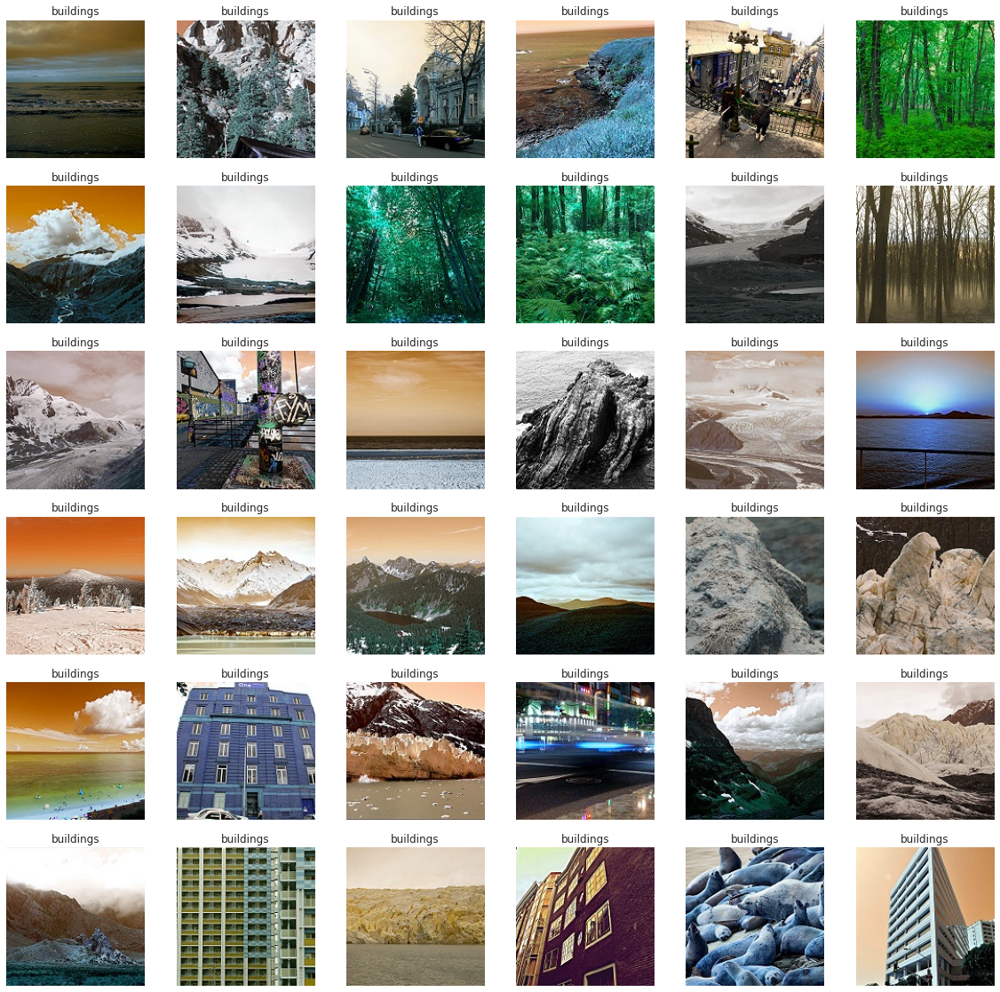

In [31]:
plt.figure(figsize=(20,20))
##show building 0code
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))#predict

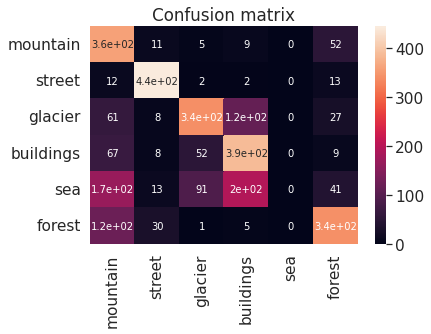

In [32]:

from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sn; sn.set(font_scale=1.4)
class_names = ['mountain', 'street', 'glacier', 'buildings', 'sea', 'forest']
CM = confusion_matrix(y_test, y_pred)
ax = plt.axes()
sn.heatmap(CM, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names,
             ax = ax)
ax.set_title('Confusion matrix')
plt.show()


In [33]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.45      0.82      0.59       437
           1       0.86      0.94      0.90       474
           2       0.69      0.62      0.65       553
           3       0.54      0.74      0.63       525
           4       0.00      0.00      0.00       510
           5       0.71      0.68      0.70       501

    accuracy                           0.63      3000
   macro avg       0.54      0.63      0.58      3000
weighted avg       0.54      0.63      0.57      3000



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


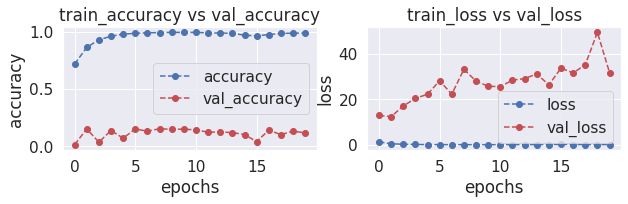

In [34]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(10,5))

    # Plot accuracy
    plt.subplot(221)
    plt.plot(history.history['accuracy'],'bo--', label = "accuracy")
    plt.plot(history.history['val_accuracy'], 'ro--', label = "val_accuracy")
    plt.title("train_accuracy vs val_accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(222)
    plt.plot(history.history['loss'],'bo--', label = "loss")
    plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()
plot_accuracy_loss(ThisModel)

In [35]:
import numpy as np
from PIL import Image
import os

from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications import VGG16 

In [36]:
image_generator = ImageDataGenerator(preprocessing_function = preprocess_input)

In [37]:
#shuffle train data & test
train_loader = image_generator.flow_from_directory(
    directory = "seg_train/seg_train",
    target_size = (224, 224),
    batch_size = 50,
    shuffle = True
)

test_loader = image_generator.flow_from_directory(
    directory = "seg_test/seg_test",
    target_size = (224, 224),
    batch_size = 50,
    shuffle = True
)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [38]:
train_loader.class_indices

{'buildings': 0,
 'forest': 1,
 'glacier': 2,
 'mountain': 3,
 'sea': 4,
 'street': 5}

In [39]:
idx_to_class = {val:key for key, val in dict(train_loader.class_indices).items()}
idx_to_class 

{0: 'buildings',
 1: 'forest',
 2: 'glacier',
 3: 'mountain',
 4: 'sea',
 5: 'street'}

In [40]:
model = Sequential()
model.add(VGG16(include_top = False, pooling = "avg"))
model.add(Dense(6, activation = "softmax"))

58889256/58889256 [==============================] - 4s 0us/step


In [41]:
model.layers[0].trainable = False

In [42]:
# Train and Test Steps
steps_train = len(train_loader)    # = round(num_train_images / batch_size)
steps_test = len(test_loader) 

In [43]:
model.compile(optimizer = "adam", loss = "categorical_crossentropy", metrics = ["accuracy"])

In [44]:
model_train_history = model.fit_generator(
    generator = train_loader,
    steps_per_epoch = steps_train,
    epochs = 2,
    validation_data = test_loader,
    validation_steps = steps_test
)

Epoch 1/2


<ipython-input-44-bb57a7cef678>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model_train_history = model.fit_generator(


281/281 [==============================] - 104s 352ms/step - loss: 0.8603 - accuracy: 0.7912 - val_loss: 0.4311 - val_accuracy: 0.8833
Epoch 2/2
281/281 [==============================] - 95s 339ms/step - loss: 0.3282 - accuracy: 0.8990 - val_loss: 0.3384 - val_accuracy: 0.8963


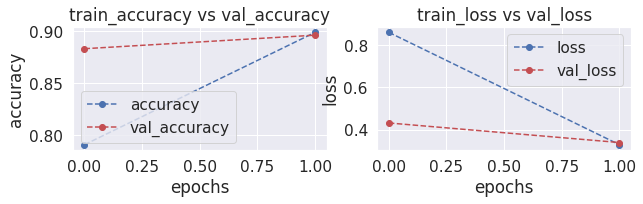

In [45]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(10,5))

    # Plot accuracy
    plt.subplot(221)
    plt.plot(history.history['accuracy'],'bo--', label = "accuracy")
    plt.plot(history.history['val_accuracy'], 'ro--', label = "val_accuracy")
    plt.title("train_accuracy vs val_accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(222)
    plt.plot(history.history['loss'],'bo--', label = "loss")
    plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()
plot_accuracy_loss(model_train_history)

In [46]:
pred_img_list = [f"seg_pred/seg_pred/{i}" for i in os.listdir("seg_pred/seg_pred")]

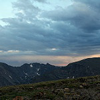

2
glacier


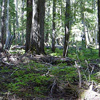

1
forest


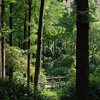

1
forest


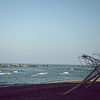

4
sea


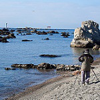

2
glacier


In [47]:
import random
for i in range(5):
  num = random.randint(0, len(pred_img_list))
  img = Image.open(pred_img_list[num])
  display(img.resize((100,100)))
  img = img.resize((224, 224))
  img_array = np.array(img)
  img_array = img_array[np.newaxis, :]
  prob = model(img_array)
  pred = np.argmax(prob)
  print(pred)
  print(idx_to_class[pred])
  print("=======================================")